<a href="https://colab.research.google.com/github/TuanPham2024/Image_retrieval_Distance_L1L2Cosin_ClipChromdbFeatures/blob/main/Project2_Mod02_Week05_Image_Retrieval_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Chương Trình Truy Vấn Ảnh Cơ Bản**

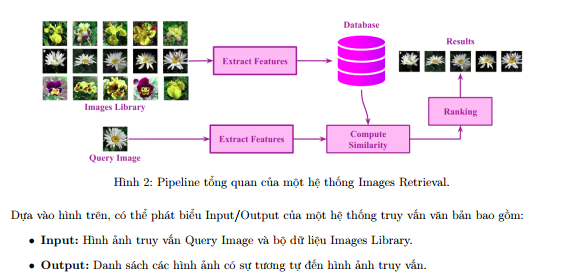

**CLIP**  là mô hình deep learning đã được huấn luyện trước, được sử dụng trong dự án này,để xây dựng một hệ thống truy xuất hình ảnh.

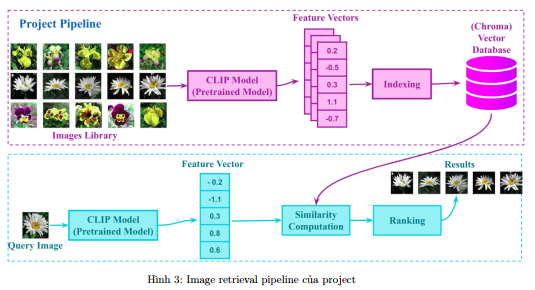

In [1]:
# một bộ data image về các loài vật
!gdown 1msLVo0g0LFmL9-qZ73vq9YEVZwbzOePF

Downloading...
From (original): https://drive.google.com/uc?id=1msLVo0g0LFmL9-qZ73vq9YEVZwbzOePF
From (redirected): https://drive.google.com/uc?id=1msLVo0g0LFmL9-qZ73vq9YEVZwbzOePF&confirm=t&uuid=b5d1e583-0f24-4ce9-9ec3-5ce90c0bea86
To: /content/data.zip
100% 76.1M/76.1M [00:00<00:00, 85.4MB/s]


In [2]:
!unzip data

Archive:  data.zip
   creating: data/
   creating: data/.ipynb_checkpoints/
   creating: data/test/
   creating: data/test/American_egret/
  inflating: data/test/American_egret/n02009912_2473.JPEG  
   creating: data/test/Doberman/
  inflating: data/test/Doberman/n02107142_52285.JPEG  
   creating: data/test/Rhodesian_ridgeback/
  inflating: data/test/Rhodesian_ridgeback/n02087394_18723.JPEG  
   creating: data/test/African_crocodile/
  inflating: data/test/African_crocodile/n01697457_18534.JPEG  
   creating: data/test/Lakeland_terrier/
  inflating: data/test/Lakeland_terrier/n02095570_4644.JPEG  
   creating: data/test/ambulance/
  inflating: data/test/ambulance/n02701002_2311.JPEG  
   creating: data/test/apiary/
  inflating: data/test/apiary/n02727426_4398.JPEG  
   creating: data/test/bannister/
  inflating: data/test/bannister/n02788148_47071.JPEG  
   creating: data/test/basketball/
  inflating: data/test/basketball/n02802426_12693.JPEG  
   creating: data/test/barn_spider/
  in

In [3]:
# Giả sử thư mục có cấu trúc như sau:
# root_folder/
# ├── dir1/
# │   ├── file1.txt
# │   └── file2.txt
# └── dir2/
#     └── file3.txt

# import os
# root_folder = '/content/data'

# image_path_list = []
# list_path = [os.path.join(image_dir, name) for name in os.listdir(image_dir)]
# for i, path in enumerate(list_path):
#         image_path_list.append(path)

# # Duyệt qua tất cả file và và thư mục con
# for dirpath, dirnames, filenames in os.walk(root_folder):
#     print(f"Đường dẫn hiện tại: {dirpath}")
#     print(f"Danh sách thư mục con: {dirnames}")
#     print(f"Danh sách file: {filenames}")
#     print()

In [3]:
# import một số thư viện cần thiết
import os
import numpy as np
from PIL import Image as Image_PIL
import matplotlib.pyplot as plt

# danh sách các class của ảnh trong data
ROOT = '/content/data'
image_dir = os.path.join(ROOT, 'train')
print('image_dir:', image_dir)
assert (image_dir) == '/content/data/train'

CLASS_NAME = sorted(list(os.listdir(image_dir)))
print(CLASS_NAME)

image_dir: /content/data/train
['African_crocodile', 'American_egret', 'Doberman', 'Lakeland_terrier', 'Orange_easy', 'Rhodesian_ridgeback', 'ambulance', 'apiary', 'bannister', 'barn_spider', 'basketball', 'black_widow', 'brain_coral', 'bullet_train', 'can_opener', 'capuchin', 'car_mirror', 'carousel', 'castle', 'china_cabinet', 'cliff_dwelling', 'comic_book', 'conch', 'cornet', 'dugong', 'electric_locomotive', 'flamingo', 'flatworm', 'goldfish', 'grocery_store', 'guillotine', 'half_track', 'hen-of-the-woods', 'horizontal_bar', 'killer_whale', 'kit_fox', 'knee_pad', 'lion', 'loudspeaker', 'lynx', 'magpie', 'meat_loaf', 'mixing_bowl', 'parachute', 'pizza', 'ram', 'red-backed_sandpiper', 'ruffed_grouse', 'safety_pin', 'scabbard', 'screen', 'steam_locomotive', 'steel_arch_bridge', 'theater_curtain', 'traffic_light', 'triceratops', 'vine_snake', 'warplane', 'white_stork', 'yawl']


In [4]:
from typing import NamedTuple
# Đọc ảnh, resize về kích thước chung (áp dụng được các phép đo) và chuyển đổi nó về dạng numpy
def read_image_from_path(path, size) -> np.array:
    """ Đọc file từ đường dẫn path(fullname) trả về np_array[image cùng kích thước (size)] """
    try:
        # Đọc hình ảnh và chuyển đổi thành mảng NumPy
        img = Image_PIL.open(path).convert('RGB')
        img = img.resize(size)
        img = np.array(img)
    except Exception as e:
        #print(f"Không thể đọc ảnh {full_path}: {e}")
        return None
    return img

def get_list_path_files_from_folder(image_dir):
    """ # Lấy danh sách các tệp tin và thư mục con trong image_dir """
    return [os.path.join(image_dir, name) for name in os.listdir(image_dir) if os.path.isfile( os.path.join(image_dir, name))]

# DUYỆT FILE TRONG THU MUC (KHÔNG THƯ MỤC CON)
def images_np_paths_ls_from_folder(image_dir, size):
    """ Đọc tất cả file trong 1 folder(full name folder)
        # Return:
        - images_np: biết  images_np[i] =  dòng[i] = [1 ảnh i: kích thước (*size, batch)]
        - image_path_list: list[tên images_file] trong thư mục
    """

    # # Lấy danh sách các tệp tin và thư mục con trong image_dir
    # for file_name in os.listdir(image_dir):
    #     full_path = os.path.join(image_dir, file_name)

    #     if os.path.isfile(full_path):
    #         print(f"'{file_name}' là một tập tin.")
    #     elif os.path.isdir(full_path):
    #         print(f"'{file_name}' là một thư mục.")

    # list[tên images_file] trong thư mục
    list_path = [os.path.join(image_dir, name) for name in os.listdir(image_dir) if os.path.isfile( os.path.join(image_dir, name)) ]
    # print(list_path[:3])

    # Unpacking với Toán tử * -> VD: values = (5, 3)  -> add(*values)  # Tương đương với add(5, 3)
    images_np = np.zeros(shape = (len(list_path), *size, 3))  # numpy images_np[i] =  dòng i = 1 ảnh, kích thước (*size, batch)
    image_path_list = []                                      # Kiểu dữ liệu list

    # Đọc ảnh
    for i, path in enumerate(list_path):
        images_np[i] = read_image_from_path(path, size)
        image_path_list.append(path)

    return images_np, image_path_list

# DUYỆT FILE TRONG THU MUC VÀ THƯ MỤC CON
def images_np_paths_ls_from_folder_walk(root_folder, size):
    """ Đọc tất cả file trong folder, subfolder, ... (full name folder)
        # Return:
        - image_arrays: biết  images_np[i] =  dòng[i] = [1 ảnh i: kích thước (*size, batch = số kênh màu)]
        - full_names_arrays: numpy_array chứ full name file ảnh trong thư mục
    """
    image_list = []
    full_names_list = []

    # Duyệt qua tất cả các thư mục con dirpath, dirnames, filenames
    for dirpath, dirnames , filenames  in os.walk(root_folder):
        for filename in filenames :
            ## Kiểm tra nếu tệp là một hình ảnh
            # if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
                # Đường dẫn đầy đủ đến tệp hình ảnh
                full_path = os.path.join(dirpath, filename)

                # Đọc hình ảnh và chuyển đổi thành mảng NumPy
                #images_np = np.zeros(shape = (len(list_path), *size, 3))  # numpy images_np[i] =  dòng i = 1 ảnh, kích thước (*size, batch)
                image = read_image_from_path(full_path, size) # Đọc file trả về array np cùng kích cỡ size
                # if image is None:
                #     continue

                # Lưu mảng và tên đầy đủ
                image_list.append(image)    # VD: [1, 2, 3].append([4, 5]) -> Kq: [1, 2, 3, [4, 5]]
                                            # VD: [1, 2, 3].extend([4, 5]) -> Kq: [1, 2, 3, 4, 5]
                full_names_list.append(full_path)
                # print(f"Đã đọc hình ảnh: {full_path}")
                # print(f"Kích thước hình ảnh: {image_array.shape}")


    # Chuyển đổi danh sách thành mảng NumPy
    image_arrays = np.array(image_list)
    # full_names_arrays = np.array(full_names_list)
    # print(f"Tổng số hình ảnh: {len(image_arrays)}")
    # print(f"Kích thước mảng: {image_arrays.shape}")

    return image_arrays, full_names_list



# TEST THỬ-----------------------
# Cách 1:
print(os.listdir(image_dir)[:3])

images_np1, images_paths_list1 = images_np_paths_ls_from_folder_walk(image_dir, (448, 448))
print("images.size =  ", images_np1.size, "; images_np.shape = ", images_np1.shape)

# Cách 2:
images_list = []
image_path_list = []
for folder_name in os.listdir(image_dir):
    if folder_name in CLASS_NAME:
        folder = os.path.join(image_dir, folder_name)
        images, images_path = images_np_paths_ls_from_folder(folder, (448, 448))
        # print("images.size =  ", images.size)

        images_list.extend(images)
        image_path_list.extend(images_path)

images_np    =  np.array(images_list)  #np.concatenate(images_list,  axis = 0) # list chứa các mảng 10 mảng
# image_path_np = np.concatenate(image_path_list,  axis = 0) # np.array(image_path_list) #

print("images_np.size :  ", images_np.size,"=",images_np1.size )
print("images_np.shape : ", images_np.shape,"=",images_np1.shape)
print("len(images_np) : ", len(images_np), "=", len(images_np1))
print("0 = ", (images_np1[0] - images_np[0])[:1] )
print(images_paths_list1[0] ," == ", image_path_list[0])

assert np.all(images_np1 == images_np)
assert np.all(np.array(images_paths_list1) == np.array(image_path_list))  #np.concatenate(image_path_list,  axis = 0)

['traffic_light', 'guillotine', 'china_cabinet']
images.size =   358256640 ; images_np.shape =  (595, 448, 448, 3)
images_np.size :   358256640 = 358256640
images_np.shape :  (595, 448, 448, 3) = (595, 448, 448, 3)
len(images_np) :  595 = 595
0 =  [[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  ...
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]
/content/data/train/traffic_light/n06874185_27019.JPEG  ==  /content/data/train/traffic_light/n06874185_27019.JPEG


**2.1.1 Truy vấn hình ảnh với độ đo L1**

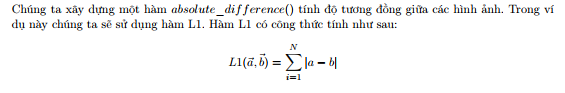

In [16]:
def plot_results(query_path, ls_path_score, reverse = False):
    fig = plt.figure(figsize=(15, 9))
    fig.add_subplot(2, 3, 1)
    plt.imshow(read_image_from_path(query_path, size=(448, 448)))
    plt.title(f"Query Image: {query_path.split('/')[2]}", fontsize=16)
    plt.axis("off")
    for i, path in enumerate(sorted(ls_path_score, key=lambda x : x[1], reverse=reverse)[:5], 2): # index i_start = 2
        fig.add_subplot(2, 3, i) # Vì ảnh gốc (2, 3, 1) -> ảnh khác là (2,3,>=2 đến 5)
        plt.imshow(read_image_from_path(path[0], size=(448,448)))
        plt.title(f"Top {i-1}: {path[0].split('/')[2]}", fontsize=16) #, Score: {ls_path_score[i-1,1]}
        plt.axis("off")
    plt.show()

In [11]:
def absolute_difference(query :np.array, data: np.array) -> np.array:
    """ Tính khoảng cách L1(vector query, vector data) numpy 'cùng kích cỡ', hay 'broadcasting được' """

    # Sử dụng kĩ thuật thêm chiều -> broadcasting  , giảm chiều->  np.squeeze(array_3d)
    axis_batch_size = tuple(range(1,len(data.shape))) # range(1,len(data.shape)) == range(1,4) == [1,2,3] -> axis_batch_size = tuple(1,2,3)
    return np.sum(np.abs(data - query), axis = axis_batch_size) # tính tổng khoảng các np.sum(Các khoảng theo sô chiều, axis = 1, 2, 3 -> lấy tổng)


len(ls_path_score) :   595 = 595
len(ls_path_score[0]) :   ('/content/data/train/cornet/n03110669_90417.JPEG', 71475464.0) = ('/content/data/train/cornet/n03110669_90417.JPEG', 65458770)
Số phần tử size :   1190
Kích thước các chiều shape :  (595, 2)
Số chiều ndim:  2


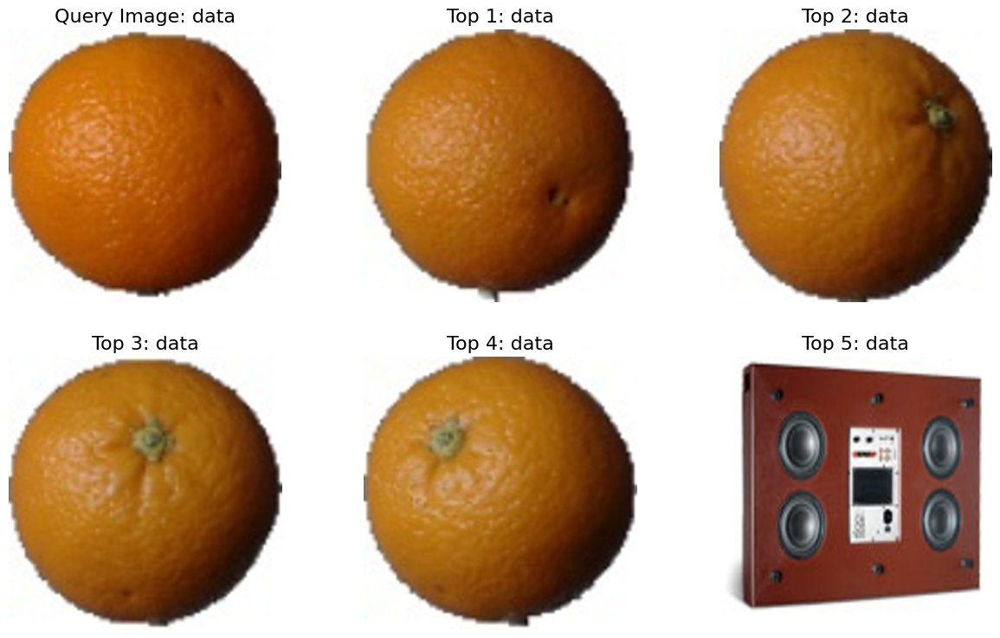

In [7]:
# get_l1_score ------------------------------------CAN CHINH SỬA-----------------------------------
def get_l1_score(root_img_path, query_path, size):

    query = read_image_from_path(query_path, size) #numpy array đã hiệu chỉnh kích thước  = size

    ls_path_score = []
    ls_images_path = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = images_np_paths_ls_from_folder(path, size) # mang numpy nhieu anh, paths
            rates = absolute_difference(query, images_np)
            ls_path_score.extend(list(zip(images_path, rates)))

    #     ls_images_path.extend(images_path)
    #     ls_img_np.extend(images_np)
    # images_np = np.array(ls_img_np)
    # rates = absolute_difference(query, np.array(ls_img_np))
    # ls_path_score.extend(list(zip(images_path, rates)))

    # # Đáng lí tốt hơn, lại không biết lỗi ở đâu
    ls_path_score1 = []

    images_np1, images_path1 = images_np_paths_ls_from_folder_walk(root_img_path, size) # mang numpy nhieu anh, paths
    rates1 = absolute_difference(query, images_np1)
    ls_path_score1.extend(list(zip(images_path1, rates1)))


    print("len(ls_path_score) :  ", len(ls_path_score),"=", len(ls_path_score1 ))
    print("len(ls_path_score[0]) :  ", ls_path_score[0],"=", ls_path_score1[0])


    # print( "ls_path_score1[0]:", ls_path_score1[0] ,"==", ls_path_score[0])
    # print( "ls_path_score1[0]:", len(ls_path_score1[0]) ,"==", len(ls_path_score[0]))
    # print("len scores", len(ls_path_score1) , "==", len(ls_path_score)) # mô tả kích thước của mảng theo từng chiều

    return query, ls_path_score

# ROOT = "/content/data"
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_path, size)


arr_scores = np.array(ls_path_score)
print("Số phần tử size :  ", arr_scores.size )
print("Kích thước các chiều shape : ", arr_scores.shape)
print("Số chiều ndim: ", arr_scores.ndim)

plot_results(query_path, ls_path_score, reverse=False)

len(ls_path_score) :   595 = 595
len(ls_path_score[0]) :   ('/content/data/train/cornet/n03110669_90417.JPEG', 38475922.0) = ('/content/data/train/cornet/n03110669_90417.JPEG', 96960530)


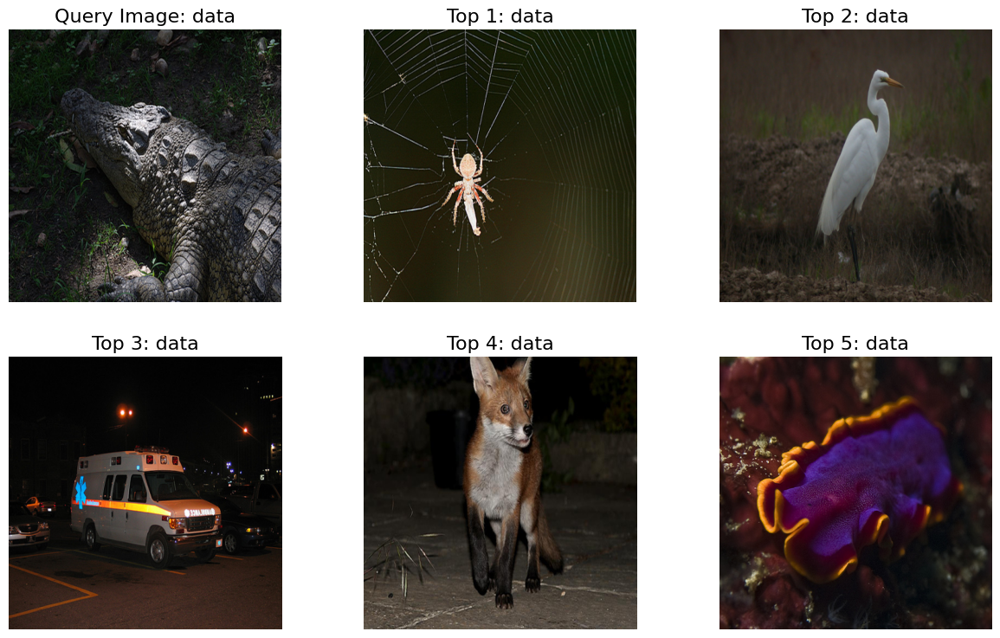

In [9]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

**2.1.2 Truy vấn hình ảnh với độ đo L2**

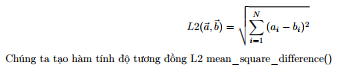

In [10]:
def mean_square_difference(query, data):
    axis_batch_size = tuple(range(1,len(data.shape)))
    return np.mean((data - query)**2, axis=axis_batch_size)

In [12]:
def get_l2_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = images_np_paths_ls_from_folder(path, size) # mang numpy nhieu anh, paths
            rates = mean_square_difference(query, images_np)
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

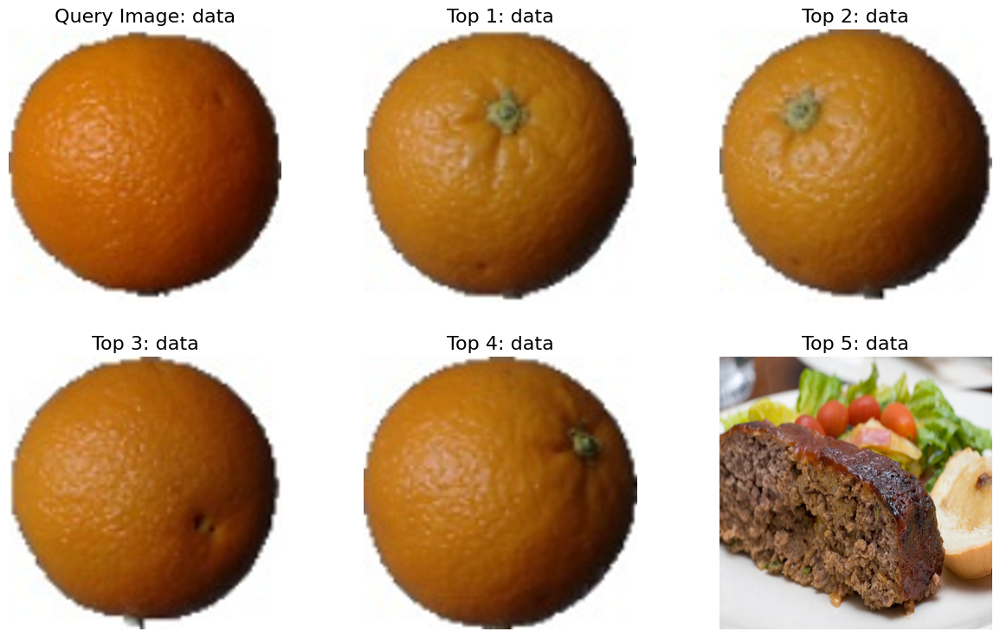

In [13]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l2_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

**2.1.3 Truy vấn hình ảnh với độ đo Cosine Similarity**

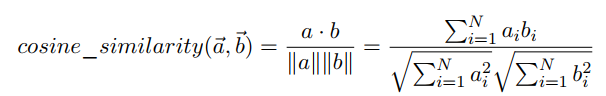

In [12]:
def cosine_similarity(query :np.array, data:np.array) -> float:
    """ cosine_similarity

    Args:
        query (np.array): query vector
        data (np.array): data vector

    Returns:
        float: cosine similarity
    """
    axis_batch_size = tuple(range(1,len(data.shape)))
    query_norm = np.sqrt(np.sum(query**2))
    data_norm = np.sqrt(np.sum(data**2, axis=axis_batch_size))
    return np.sum(data * query, axis=axis_batch_size) / (query_norm*data_norm + np.finfo(float).eps)

In [26]:
def get_cosine_similarity_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = images_np_paths_ls_from_folder(path, size) # mang numpy nhieu anh,             paths
            rates = cosine_similarity(query, images_np)
            ls_path_score.extend(list(zip(images_path, rates)))

    # images_np, images_path = images_np_paths_ls_from_folder_walk(root_img_path, size)
    # rates = cosine_similarity(query, images_np)
    # ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

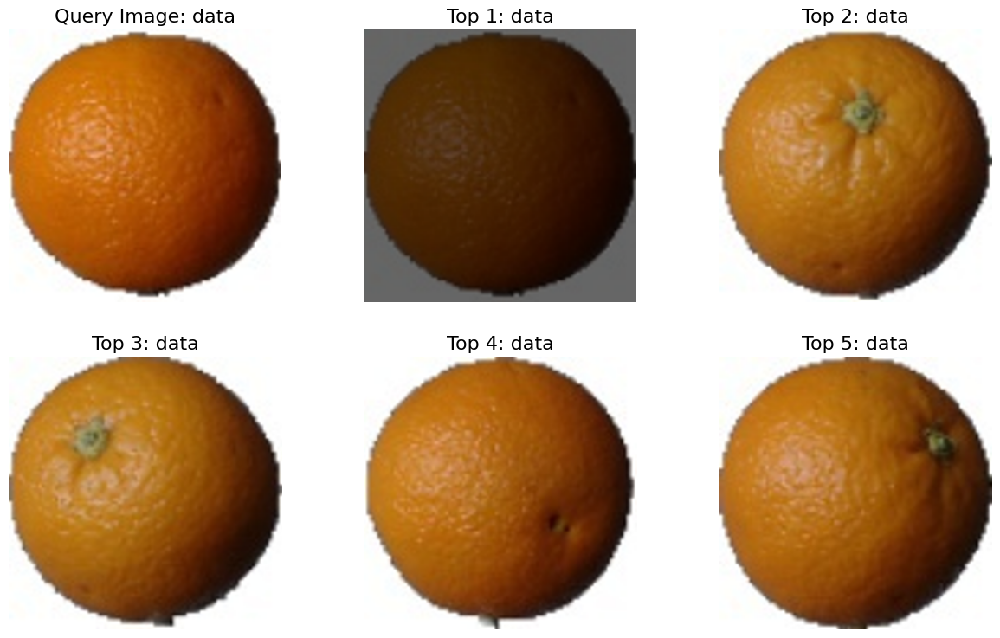

In [27]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

**2.1.4 Truy vấn hình ảnh với độ đo Correlation Coefficient**

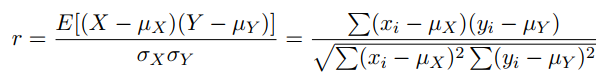

In [13]:
def correlation_coefficient(query, data):
    axis_batch_size = tuple(range(1,len(data.shape)))
    query_minus_mean = query - np.mean(query)
    data_minus_mean = data - np.mean(data, axis=axis_batch_size, keepdims = True)
    query_minus_norm = np.sqrt(np.sum(query_minus_mean**2))
    data_minus_norm = np.sqrt(np.sum(data_minus_mean**2, axis=axis_batch_size))

    # np.finfo(float).eps == số epsilon nhỏ nhất + 1.0  -> số mới khác 1.0
    return np.sum(data_minus_mean * query_minus_mean, axis=axis_batch_size) / (query_minus_norm*data_minus_norm + np.finfo(float).eps)

In [14]:
def get_correlation_coefficient_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = images_np_paths_ls_from_folder(path, size) # mang numpy nhieu anh, paths
            rates = correlation_coefficient(query, images_np)
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

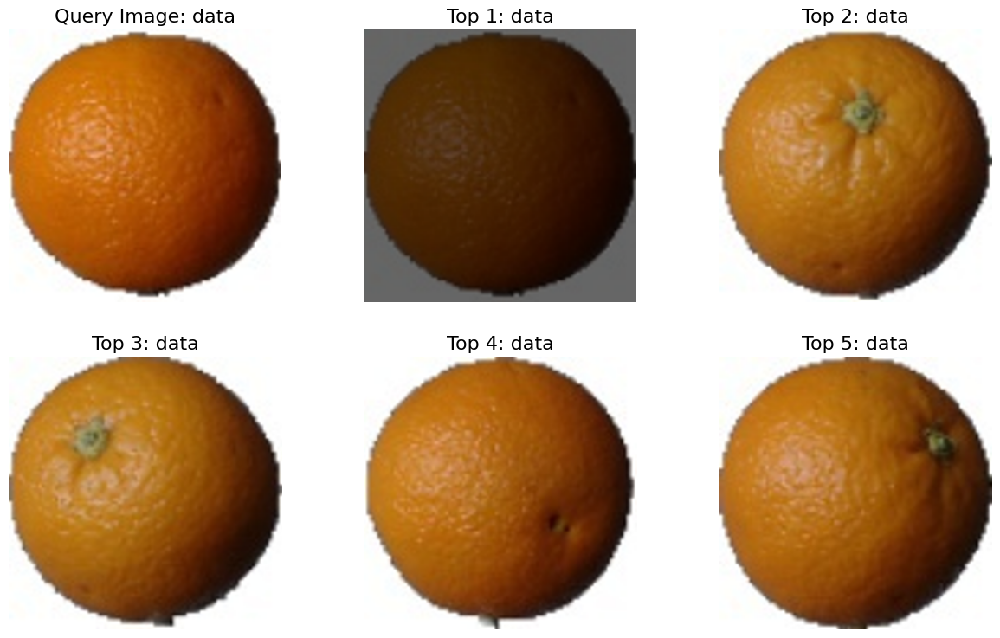

In [31]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

**II. Truy Vấn Ảnh Nâng Cao**

1. Sử dụng **deep learning model** trích xuất feature vector cho các ảnh để tăng cường khả năng truy xuất hình ảnh chính xác hơn.

Image retrieval sử dụng pretrained deep learning model là một quá trình mà trong đó, các mô hình học sâu đã được đào tạo trước được sử dụng để tìm kiếm và lấy ra các hình ảnh liên quan từ một tập dữ liệu lớn dựa trên nội dung hình ảnh. Các mô hình này thường được huấn luyện trên các tập dữ liệu khổng lồ với hàng triệu hình ảnh để học các đặc điểm quan trọng từ ảnh, cho phép chúng hiểu và biểu diễn nội dung ảnh một cách hiệu quả.


Trong quá trình tìm kiếm ảnh, một hình ảnh truy vấn được đưa vào mô hình, mô hình sẽ tính toán đặc trưng của hình ảnh truy vấn và so sánh chúng với các đặc trưng đã được tính toán trước của những hình ảnh được lưu trữ trên hệ thống. Sự tương đồng giữa các đặc trưng này được sử dụng để xác định các hình ảnh có liên quan nhất, và kết quả là những hình ảnh tương tự nhất với hình ảnh truy vấn được
trả về cho người dùng. Những mô hình này có khả năng phân tích và nhận diện các đặc tính phức tạp của ảnh như kết cấu, hình dạng, và màu sắc, do đó chúng rất hiệu quả trong việc tìm kiếm và lấy lại hình ảnh dựa trên nội dung.

In [5]:
# chromadb và open-clip-torch
!pip install chromadb
!pip install open-clip-torch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 6.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 584.3/584.3 kB 36.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 81.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 273.8/273.8 kB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.2/93.2 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 67.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.6/67.6 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 97.3 MB/s eta 0:00:0

In [6]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from chromadb.utils.embedding_functions import OpenCLIPEmbeddingFunction

**Sử dụng mô hình CLIP** thêm một hàm để trích xuất vector
đặc trưng cho mỗi hình ảnh.

Mô hình CLIP sẽ được sử dụng để biến đổi hình ảnh thành các vector đặc trưng đại diện cho nội dung và ngữ cảnh của hình ảnh đó (không sử dụng toàn bộ hình ảnh)

In [7]:
embedding_function = OpenCLIPEmbeddingFunction()

def get_single_image_embedding(image: np.array) -> np.array:
    """ Trích xuất đăt trưng cho một hình ảnh đơn lẻ. """
    embedding = embedding_function._encode_image(image=image)
    return np.array(embedding)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


open_clip_pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

In [8]:
def get_l1_score_using_feature_clip(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    # trích xuất đặc trưng feature cho query
    query_embedding = get_single_image_embedding(query.astype(np.uint8))
    ls_path_score = []

    # trích xuất ảnh (toàn bộ) và đường dẫn
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = images_np_paths_ls_from_folder(path, size) # mang numpy nhieu anh, paths

        embedding_list = []
        for idx_img in range(images_np.shape[0]):
            # trích suất đặc trưng cho từng ảnh
            embedding = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
            embedding_list.append(embedding)


        # "np.stack(embedding_list)""  ghép (concatenate) dọc theo một trục -> np.array
        #   LIST                       ---->               NP.ARRAY
        # embedding_list = [np.array([1, 2, 3]),        array([[1, 2, 3],
            # np.array([4, 5, 6]),     ---->>                  [4, 5, 6],
            # np.array([7, 8, 9])]                             [7, 8, 9]])
        #  sử dụng để  một chuỗi các mảng (arrays) lại với nhau dọc theo một trục mới (axis mới)

        # So sánh đặc trưng ảnh gốc và query qua L1
        rates = absolute_difference(query_embedding, np.stack(embedding_list))
        ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score



Số phần tử size :   1190
Kích thước các chiều shape :  (595, 2)


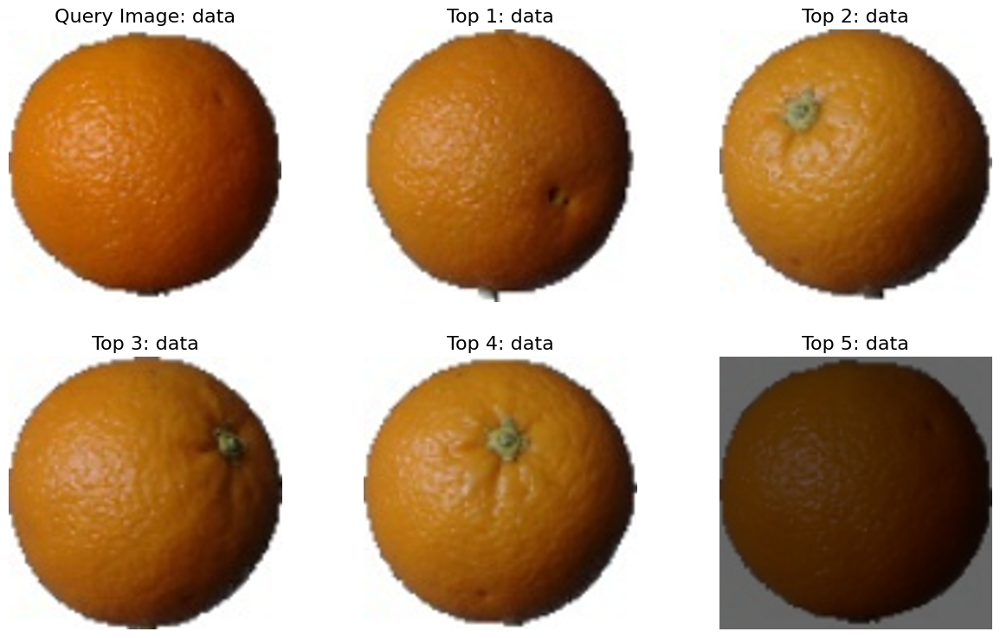

In [17]:
# ROOT = "/content/data"
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l1_score_using_feature_clip(root_img_path, query_path, size)


arr_scores = np.array(ls_path_score)
print("Số phần tử size :  ", arr_scores.size )
print("Kích thước các chiều shape : ", arr_scores.shape)
# print("Số chiều ndim: ", arr_scores.ndim)

plot_results(query_path, ls_path_score, reverse=False)

In [18]:
def get_l2_score_using_feature_clip(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query.astype(np.uint8))
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = images_np_paths_ls_from_folder(path, size) # mang numpy nhieu anh,  paths

    embedding_list = []
    for idx_img in range(images_np.shape[0]):
        embedding = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
        embedding_list.append(embedding)
    rates = mean_square_difference(query_embedding, np.stack(embedding_list))
    ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

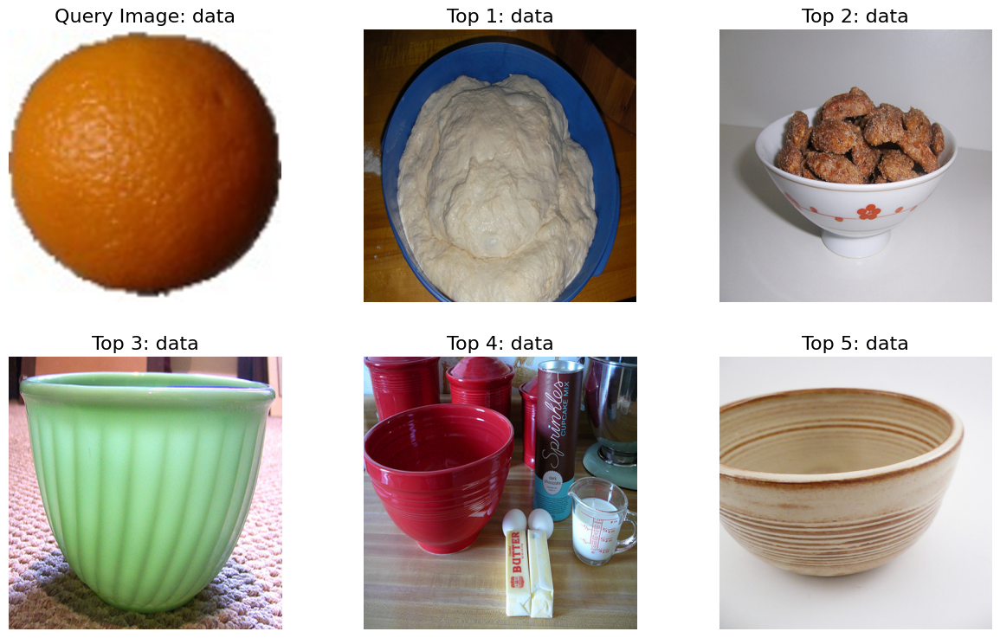

In [24]:
# ROOT = "/content/data"
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l2_score_using_feature_clip(root_img_path, query_path, size)

plot_results(query_path, ls_path_score, reverse=False)

In [25]:
def get_cosine_similarity_score_using_feature_clip(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query.astype(np.uint8))
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = images_np_paths_ls_from_folder(path, size) # mang numpy nhieu anh,        paths
    embedding_list = []
    for idx_img in range(images_np.shape[0]):
        embedding = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
        embedding_list.append(embedding)

    rates = cosine_similarity(query_embedding, np.stack(embedding_list))
    ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

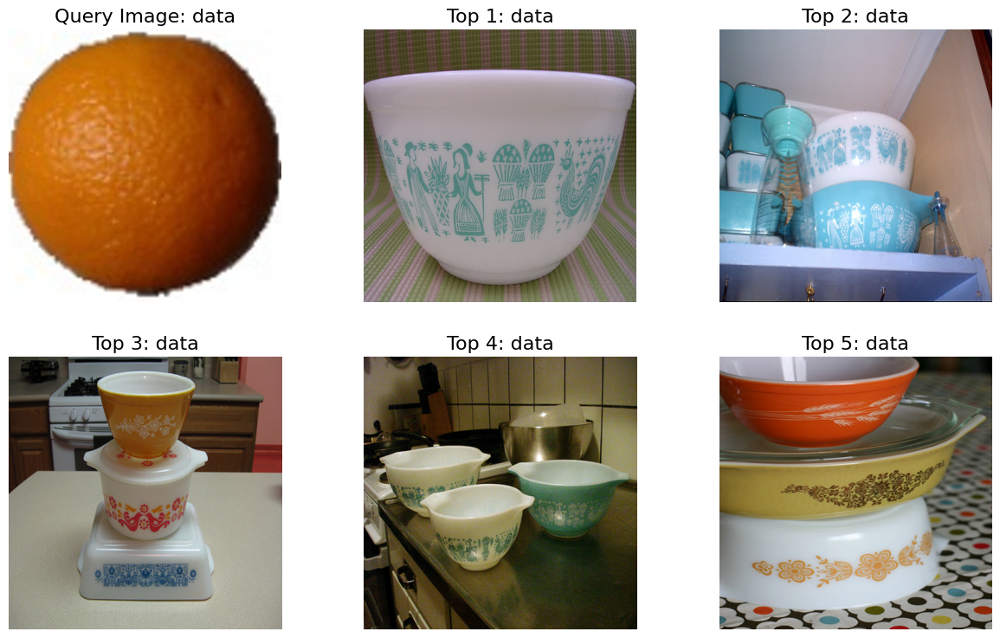

In [26]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score_using_feature_clip(root_img_path, query_path, size)

plot_results(query_path, ls_path_score, reverse=False)

In [27]:
def get_correlation_coefficient_score_using_feature_clip(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = images_np_paths_ls_from_folder(path, size) # mang numpy nhieu anh,paths

    embedding_list = []
    for idx_img in range(images_np.shape[0]):
        embedding = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
        embedding_list.append(embedding)
    rates = correlation_coefficient(query_embedding, np.stack(embedding_list))
    ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

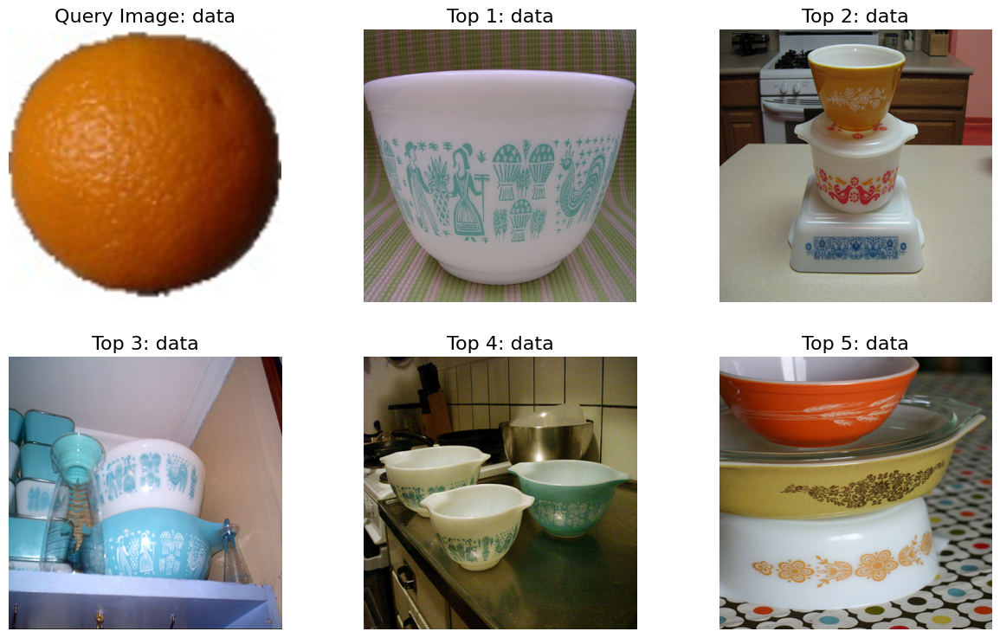

In [28]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score_using_feature_clip(root_img_path, query_path, size)

plot_results(query_path, ls_path_score, reverse=False)

In [41]:
def get_files_path(path):
    files_path = []
    for label in CLASS_NAME:
        label_path = path + "/" + label
        filenames = os.listdir(label_path)

    for filename in filenames:
        filepath = label_path + '/' + filename
        files_path.append(filepath)

    return files_path

data_path = f'{ROOT}/train'
files_path = get_files_path(path=data_path)

In [47]:
from tqdm import tqdm
def add_embedding(collection, files_path):
    """trích xuất và lưu trữ các vector đặc trưng của ảnh vào một collection đã được tạo"""
    ids = []
    embeddings = []
    for id_filepath, filepath in tqdm(enumerate(files_path)):
        ids.append(f'id_{id_filepath}')
        image = Image.open(filepath)
        embedding = get_single_image_embedding(image=image)
        embeddings.append(embedding)

    # collection trong ChromaDB có thể được hiểu như là một tập hợp các vector hoặc tài liệu được chỉ mục và lưu trữ cùng nhau
    collection.add(
        embeddings=embeddings,
        ids=ids
        )

In [ ]:
import chromadb
from chromadb import Client
# Create a Chroma Client
chroma_client = chromadb.Client()

# Tạo hoặc lấy một Collection
collection_name = "l2_collection"
metadata = {"HNSW_SPACE": "cosine"}  # Đây là phần metadata tùy chọn, bạn có thể tùy chỉnh

# Create a collection
l2_collection = chroma_client.get_or_create_collection(
    name = "l2_collection",
    metadata = {"HNSW_SPACE": "l2"})
add_embedding(collection = l2_collection, files_path = files_path)

In [33]:
def search(image_path, collection, n_results):
    query_image = Image.open(image_path)
    query_embedding = get_single_image_embedding(query_image)
    results = collection.query(
        query_embeddings=[query_embedding],
        n_results=n_results # how many results to return
        )
    return results

In [34]:
test_path = f’{ROOT}/test
test_files_path = get_files_path(path=test_path)
test_path = test_files_path[1]
l2_results = search(image_path=test_path, collection=l2_collection, n_results=5)
plot_results(image_path=test_path, files_path=files_path, results=l2_results)

SyntaxError: invalid character '’' (U+2019) (<ipython-input-34-fb01ccafa768>, line 1)

In [ ]:
# Create a collection
cosine_collection = chroma_client.get_or_create_collection(name="Cosine_collection",
    metadata={HNSW_SPACE: "cosine"})
add_embedding(collection=cosine_collection, files_path=files_path)